# Dead Tree Segmentation with DeepLabV3+ (4-Channel Input)

- **Date** : 25/07/2025

## Overview

This notebook implements a deep learning baseline for semantic segmentation of standing dead trees in aerial imagery, using the **DeepLabV3+** model. The pipeline supports multi-channel input (RGB + NIR).

## Key Features

- Data loading and preprocessing for 4-channel aerial imagery.
- Stratified splitting into train, validation, and test sets.
- DeepLabV3+ model construction, supporting custom input channels.
- Model training and validation with IoU/Dice metrics.
- Visualization of segmentation results and evaluation curves.
- Saving of best model weights and experiment history.


## 1. Environment Setup

- **torch**: Core deep learning framework for model construction and training.
- **segmentation_models_pytorch**: State-of-the-art segmentation models, including DeepLabV3+ and pretrained backbones, supporting multi-channel input.
- **numpy / pandas**: Efficient numerical computing and tabular data processing.
- **opencv-python (cv2)**: Image I/O, channel merging, and color space transformation for aerial imagery.
- **albumentations**: Flexible, high-performance data augmentation and PyTorch-compatible tensor conversion.
- **matplotlib**: Visualization of training metrics and segmentation results.
- **scikit-learn**: Stratified K-fold splitting, cross-validation, and evaluation metrics for reproducible experiments.


In [ ]:
# --- PyTorch ---
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader

# --- Pretrained Models & Utilities ---
from torchvision import transforms
import segmentation_models_pytorch as smp

# --- Image & Data Processing ---
import numpy as np
import pandas as pd
import cv2

# --- Data Augmentation ---
import albumentations as A
from albumentations.pytorch import ToTensorV2


# --- Visualization ---
import matplotlib.pyplot as plt

# --- Progress Bar & Cross-validation ---
# from tqdm import tqdm
from sklearn.model_selection import train_test_split, StratifiedKFold

# --- Base ---
import os
import glob
import random
import warnings

# --- Environment Setup ---
warnings.filterwarnings('ignore')
torch.manual_seed(42)
np.random.seed(42)
random.seed(42)

# --- Version ---
os.environ["NO_ALBUMENTATIONS_UPDATE"] = "1"

# --- Device Selection ---
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print("Using device:", device)

Using device: cuda


## 2. Data Exploration and Analysis

In [33]:
# Dataset directory
base_dir = '/content/drive/MyDrive/USA_segmentation'
mask_dir = os.path.join(base_dir, 'masks')
nrg_dir = os.path.join(base_dir, 'NRG_images')
rgb_dir = os.path.join(base_dir, 'RGB_images')

# Check if exist
for dir in [mask_dir, rgb_dir, nrg_dir]:
    if not os.path.exists(dir):
        print(f'Warning: Directory {dir} does not exist!')
    else:
        print(f'Directory {dir} exists')

# Get file lists
mask_files = sorted(glob.glob(os.path.join(mask_dir, '*.png')))
rgb_files = sorted(glob.glob(os.path.join(rgb_dir, '*.png')))
nrg_files = sorted(glob.glob(os.path.join(nrg_dir, '*.png')))

print(f'Found {len(mask_files)} mask files')
print(f'Found {len(rgb_files)} RGB files')
print(f'Found {len(nrg_files)} NRG files')

# Check correspondence of data filenames
def extract_filename_key(filepath):
    """Extract key identifier from file path"""
    filename = os.path.basename(filepath)
    # Remove corresponding prefix from filename
    if filename.startswith('mask_'):
        return filename[5:]  # Remove 'mask_' prefix
    elif filename.startswith('RGB_'):
        return filename[4:]  # Remove 'RGB_' prefix
    elif filename.startswith('NRG_'):
        return filename[4:]  # Remove 'NRG_' prefix
    return filename

# Check filename correspondence
mask_keys = [extract_filename_key(f) for f in mask_files]
rgb_keys = [extract_filename_key(f) for f in rgb_files]
nrg_keys = [extract_filename_key(f) for f in nrg_files]

print(f'Sample mask keys: {mask_keys[:5]}')
print(f'Sample RGB keys: {rgb_keys[:5]}')
print(f'Sample NRG keys: {nrg_keys[:5]}')

# Find files common to all three data types
common_keys = set(mask_keys) & set(rgb_keys) & set(nrg_keys)
print(f'Common files across all three types: {len(common_keys)}')

# Create matched file list
matched_files = []
for key in common_keys:
    mask_file = next((f for f in mask_files if extract_filename_key(f) == key), None)
    rgb_file = next((f for f in rgb_files if extract_filename_key(f) == key), None)
    nrg_file = next((f for f in nrg_files if extract_filename_key(f) == key), None)

    if mask_file and rgb_file and nrg_file:
        matched_files.append({
            'key': key,
            'mask': mask_file,
            'rgb': rgb_file,
            'nrg': nrg_file
        })

print(f'Successfully matched {len(matched_files)} files')


Directory /content/drive/MyDrive/USA_segmentation/masks exists
Directory /content/drive/MyDrive/USA_segmentation/RGB_images exists
Directory /content/drive/MyDrive/USA_segmentation/NRG_images exists
Found 444 mask files
Found 444 RGB files
Found 444 NRG files
Sample mask keys: ['ar037_2019_n_06_04_0.png', 'ar037_2019_n_07_05_0.png', 'ar037_2019_n_07_17_1.png', 'ar037_2019_n_08_14_0.png', 'ar037_2019_n_13_13_0.png']
Sample RGB keys: ['ar037_2019_n_06_04_0.png', 'ar037_2019_n_07_05_0.png', 'ar037_2019_n_07_17_1.png', 'ar037_2019_n_08_14_0.png', 'ar037_2019_n_13_13_0.png']
Sample NRG keys: ['ar037_2019_n_06_04_0.png', 'ar037_2019_n_07_05_0.png', 'ar037_2019_n_07_17_1.png', 'ar037_2019_n_08_14_0.png', 'ar037_2019_n_13_13_0.png']
Common files across all three types: 444
Successfully matched 444 files


Death tree ratio statistics:
Mean: 0.0189
Median: 0.0132
Std: 0.0177
Min: 0.0000
Max: 0.1272


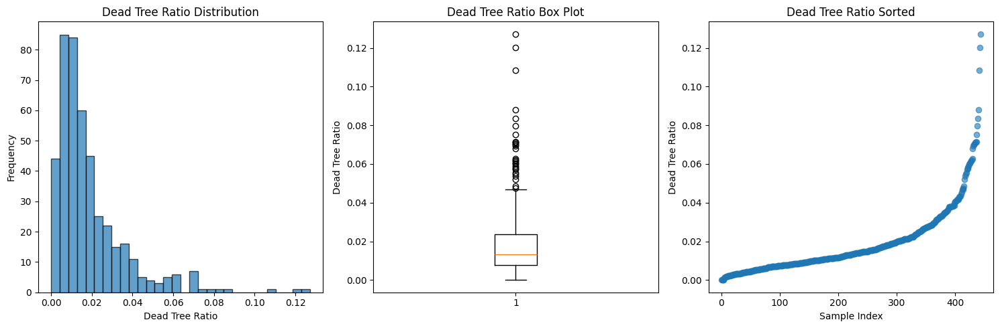

In [34]:
# Dead tree pixel ratio statistics

def calculate_dead_tree_ratio(mask_path):
    """Calculate dead tree pixel ratio"""
    try:
        mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE) # type: ignore
        if mask is None:
            return 0.0

        # Assume dead tree pixel values are non-zero
        dead_tree_pixels = np.sum(mask > 0) # type: ignore
        total_pixels = mask.size

        return dead_tree_pixels / total_pixels if total_pixels > 0 else 0.0
    except Exception as e:
        print(f'Error processing {mask_path}: {e}')
        return 0.0

# Calculate dead tree ratio for each mask
dead_tree_ratios = []
for file_info in matched_files: # type: ignore
    ratio = calculate_dead_tree_ratio(file_info['mask'])
    dead_tree_ratios.append(ratio)
    file_info['dead_tree_ratio'] = ratio

# Statistical analysis
ratios_array = np.array(dead_tree_ratios)
print(f'Death tree ratio statistics:')
print(f'Mean: {np.mean(ratios_array):.4f}')
print(f'Median: {np.median(ratios_array):.4f}')
print(f'Std: {np.std(ratios_array):.4f}')
print(f'Min: {np.min(ratios_array):.4f}')
print(f'Max: {np.max(ratios_array):.4f}')

# Visualize dead tree ratio distribution
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1) # type: ignore
plt.hist(ratios_array, bins=30, alpha=0.7, edgecolor='black')
plt.title('Dead Tree Ratio Distribution')
plt.xlabel('Dead Tree Ratio')
plt.ylabel('Frequency')

plt.subplot(1, 3, 2)
plt.boxplot(ratios_array)
plt.title('Dead Tree Ratio Box Plot')
plt.ylabel('Dead Tree Ratio')

plt.subplot(1, 3, 3)
plt.scatter(range(len(ratios_array)), sorted(ratios_array), alpha=0.6)
plt.title('Dead Tree Ratio Sorted')
plt.xlabel('Sample Index')
plt.ylabel('Dead Tree Ratio')

plt.tight_layout()
plt.show()

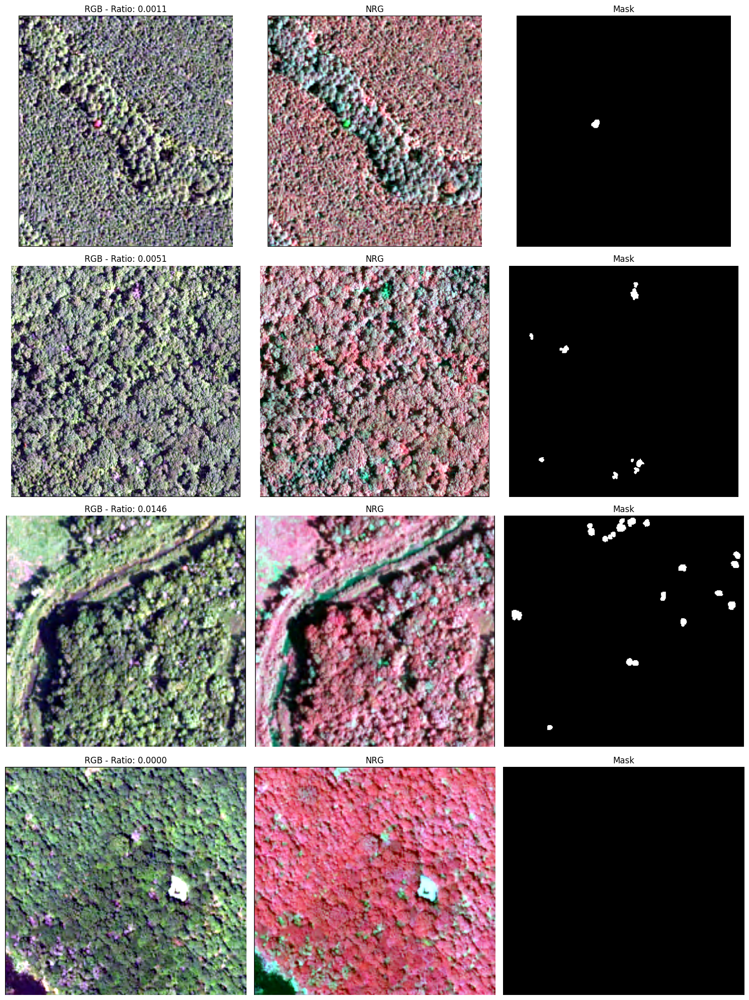

In [35]:
# Sample image visualization
def visualize_samples(matched_files, num_samples=4):
    """Visualize sample images"""
    fig, axes = plt.subplots(num_samples, 3, figsize=(15, 5*num_samples))

    sample_indices = np.random.choice(len(matched_files), num_samples, replace=False)

    for i, idx in enumerate(sample_indices):
        file_info = matched_files[idx]

        # Load images
        try:
            rgb_img = cv2.imread(file_info['rgb'])
            rgb_img = cv2.cvtColor(rgb_img, cv2.COLOR_BGR2RGB)

            nrg_img = cv2.imread(file_info['nrg'])
            nrg_img = cv2.cvtColor(nrg_img, cv2.COLOR_BGR2RGB)

            mask_img = cv2.imread(file_info['mask'], cv2.IMREAD_GRAYSCALE)

            # Show images
            axes[i, 0].imshow(rgb_img)
            axes[i, 0].set_title(f'RGB - Ratio: {file_info["dead_tree_ratio"]:.4f}')
            axes[i, 0].axis('off')

            axes[i, 1].imshow(nrg_img)
            axes[i, 1].set_title('NRG')
            axes[i, 1].axis('off')

            axes[i, 2].imshow(mask_img, cmap='gray')
            axes[i, 2].set_title('Mask')
            axes[i, 2].axis('off')

        except Exception as e:
            print(f'Error loading images for sample {idx}: {e}')

    plt.tight_layout()
    plt.show()

visualize_samples(matched_files)

## 3.Stratified K-Fold Cross-Validation Implementation

In [36]:
# Stratified split function
def create_stratified_splits(matched_files, n_splits=5, test_size=0.2):
    """Create stratified K-fold splits"""
    # Extract dead tree ratios
    ratios = [f['dead_tree_ratio'] for f in matched_files]

    # Create stratification labels (low, medium, high content)
    ratio_percentiles = np.percentile(ratios, [33, 67])
    stratify_labels = []

    for ratio in ratios:
        if ratio <= ratio_percentiles[0]:
            stratify_labels.append(0)  # Low content
        elif ratio <= ratio_percentiles[1]:
            stratify_labels.append(1)  # Medium content
        else:
            stratify_labels.append(2)  # High content

    print(f'Stratification distribution:')
    unique, counts = np.unique(stratify_labels, return_counts=True)
    for label, count in zip(unique, counts):
        print(f'  Class {label}: {count} samples ({count/len(stratify_labels)*100:.1f}%)')

    # First split out test set
    from sklearn.model_selection import train_test_split

    indices = np.arange(len(matched_files))
    train_val_idx, test_idx = train_test_split(
        indices, test_size=test_size, stratify=stratify_labels, random_state=42
    )

    # Create K-fold cross-validation
    skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)
    train_val_labels = [stratify_labels[i] for i in train_val_idx]

    folds = []
    for fold_idx, (train_idx, val_idx) in enumerate(skf.split(train_val_idx, train_val_labels)):
        fold_train_idx = train_val_idx[train_idx]
        fold_val_idx = train_val_idx[val_idx]

        fold_info = {
            'fold': fold_idx,
            'train_idx': fold_train_idx,
            'val_idx': fold_val_idx,
            'test_idx': test_idx
        }
        folds.append(fold_info)

    return folds, stratify_labels

# Create stratified K-fold splits
folds, stratify_labels = create_stratified_splits(matched_files, n_splits=5, test_size=0.2)

print(f'\nCreated {len(folds)} folds')
for i, fold in enumerate(folds):
    print(f'Fold {i}: Train={len(fold["train_idx"])}, Val={len(fold["val_idx"])}, Test={len(fold["test_idx"])}')

Stratification distribution:
  Class 0: 147 samples (33.1%)
  Class 1: 150 samples (33.8%)
  Class 2: 147 samples (33.1%)

Created 5 folds
Fold 0: Train=284, Val=71, Test=89
Fold 1: Train=284, Val=71, Test=89
Fold 2: Train=284, Val=71, Test=89
Fold 3: Train=284, Val=71, Test=89
Fold 4: Train=284, Val=71, Test=89


## 4. Data Loader Implementation

In [37]:
class DeadTreeDataset(Dataset):
    """Dead tree segmentation dataset"""

    def __init__(self, matched_files, indices, input_type='rgb', transform=None, target_size=(256, 256)):
        """
        Args:
            matched_files: matched file list
            indices: data indices
            input_type: 'rgb', 'nrg', or 'rgb_nir'
            transform: data augmentation
            target_size: target image size
        """
        self.matched_files = matched_files
        self.indices = indices
        self.input_type = input_type
        self.transform = transform
        self.target_size = target_size

    def __len__(self):
        return len(self.indices)

    def __getitem__(self, idx):
        file_idx = self.indices[idx]
        file_info = self.matched_files[file_idx]

        if self.input_type == 'rgb':
            image = cv2.imread(file_info['rgb'])
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        elif self.input_type == 'nrg':
            image = cv2.imread(file_info['nrg'])
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        elif self.input_type == 'rgb_nir':
            # Load RGB
            rgb_img = cv2.imread(file_info['rgb'])
            rgb_img = cv2.cvtColor(rgb_img, cv2.COLOR_BGR2RGB)
            # Load NRG, take NIR channel (assume NIR is channel 0)
            nrg_img = cv2.imread(file_info['nrg'])
            nrg_img = cv2.cvtColor(nrg_img, cv2.COLOR_BGR2RGB)
            nir_channel = nrg_img[:, :, 0]
            # Merge to 4 channels
            image = np.concatenate([rgb_img, nir_channel[..., None]], axis=2)
        else:
            raise ValueError(f"Unknown input_type: {self.input_type}")

        # Load mask
        mask = cv2.imread(file_info['mask'], cv2.IMREAD_GRAYSCALE)

        # Resize
        if image.shape[:2] != self.target_size:
            image = cv2.resize(image, self.target_size)
        if mask.shape != self.target_size:
            mask = cv2.resize(mask, self.target_size)

        # Binarize mask
        mask = (mask > 0).astype(np.uint8)

        # Apply augmentation
        if self.transform:
            augmented = self.transform(image=image, mask=mask)
            image = augmented['image']
            mask = augmented['mask']
        if mask.dim() == 2:
            mask = mask.unsqueeze(0)

        return image, mask.long()

# Data augmentation configuration
def get_transforms(phase='train', input_channels=3):
    """Get augmentation configuration"""
    mean = [0.485, 0.456, 0.406] + ([0.5] if input_channels == 4 else [])
    std = [0.229, 0.224, 0.225] + ([0.25] if input_channels == 4 else [])
    if phase == 'train':
        return A.Compose([
            A.HorizontalFlip(p=0.5),
            A.VerticalFlip(p=0.5),
            A.Rotate(limit=15, p=0.5),
            A.RandomBrightnessContrast(p=0.3),
            A.Normalize(mean=mean, std=std),
            ToTensorV2()
        ])
    else:
        return A.Compose([
            A.Normalize(mean=mean, std=std),
            ToTensorV2()
        ])

# Test data loader
train_transform = get_transforms('train', input_channels=4)
val_transform = get_transforms('val', input_channels=4)

# Create test dataset
# input_type='rgb_nir', 4 channels
test_dataset = DeadTreeDataset(
    matched_files,
    folds[0]['train_idx'][:10],
    input_type='rgb_nir',
    transform=train_transform
)

# Test data loading
test_loader = DataLoader(test_dataset, batch_size=2, shuffle=False)
sample_batch = next(iter(test_loader))
print(f'Sample batch - Image shape: {sample_batch[0].shape}, Mask shape: {sample_batch[1].shape}')
print(f'Image dtype: {sample_batch[0].dtype}, Mask dtype: {sample_batch[1].dtype}')

Sample batch - Image shape: torch.Size([2, 4, 256, 256]), Mask shape: torch.Size([2, 1, 256, 256])
Image dtype: torch.float32, Mask dtype: torch.int64


## 5.Model 

In [38]:
try:
    from torchsummary import summary
    TORCHSUMMARY_AVAILABLE = True
except ImportError:
    TORCHSUMMARY_AVAILABLE = False

def create_model(input_type='rgb_nir', device='cuda'):
    in_channels = 4 if input_type == 'rgb_nir' else 3
    model = smp.DeepLabV3Plus(
        encoder_name="resnet50",
        encoder_weights=None,
        in_channels=in_channels,
        classes=1
    )
    return model.to(device)

def display_model_info(model, input_shape, device):
    print("="*60)
    print("MODEL INFORMATION")
    print("="*60)
    total_params = sum(p.numel() for p in model.parameters())
    trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
    print(f"Model Architecture: DeepLabV3+")
    # print(f"Input Channels: {model.in_channels}")
    # print(f"Output Channels: {model.out_channels}")
    print(f"Input Shape: {input_shape}")
    print(f"Total Parameters: {total_params:,}")
    print(f"Trainable Parameters: {trainable_params:,}")
    print(f"Model Size (MB): {total_params * 4 / (1024**2):.2f}")
    if TORCHSUMMARY_AVAILABLE:
        print("\n" + "="*60)
        print("DETAILED ARCHITECTURE SUMMARY")
        print("="*60)
        summary(model.encoder, input_shape[1:])
    else:
        print(f"\nInstall torchsummary for detailed architecture: pip install torchsummary")
        print("\n" + "="*60)
        print("MODEL STRUCTURE OVERVIEW")
        print("="*60)
        print(model)

# Test model
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print("Creating and testing 4-channel DeepLabV3+ model...")
test_model = create_model(input_type='rgb_nir', device=device)
test_input = torch.randn(1, 4, 256, 256).to(device)
test_model.eval()
with torch.no_grad():
    test_output = test_model(test_input)
print(f'Model test - Input shape: {test_input.shape}, Output shape: {test_output.shape}')
print(f'Output range: [{test_output.min():.4f}, {test_output.max():.4f}]')
display_model_info(test_model, test_input.shape, device)



Creating and testing 4-channel DeepLabV3+ model...
Model test - Input shape: torch.Size([1, 4, 256, 256]), Output shape: torch.Size([1, 1, 256, 256])
Output range: [-0.2812, 0.3285]
MODEL INFORMATION
Model Architecture: DeepLabV3+
Input Shape: torch.Size([1, 4, 256, 256])
Total Parameters: 26,680,721
Trainable Parameters: 26,680,721
Model Size (MB): 101.78

DETAILED ARCHITECTURE SUMMARY
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 128, 128]          12,544
       BatchNorm2d-2         [-1, 64, 128, 128]             128
              ReLU-3         [-1, 64, 128, 128]               0
         MaxPool2d-4           [-1, 64, 64, 64]               0
            Conv2d-5           [-1, 64, 64, 64]           4,096
       BatchNorm2d-6           [-1, 64, 64, 64]             128
              ReLU-7           [-1, 64, 64, 64]               0
            Conv2d-8           [-

## 6. Loss Functions and Evaluation Metrics

In [39]:
class DiceLoss(nn.Module):
    def __init__(self, smooth=1.0):
        super().__init__()
        self.smooth = smooth

    def forward(self, logits, targets):
        probs = torch.sigmoid(logits)
        targets = targets.float()

        # Flatten
        probs_flat = probs.view(probs.size(0), -1)
        targets_flat = targets.view(targets.size(0), -1)

        intersection = (probs_flat * targets_flat).sum(1)
        union = probs_flat.sum(1) + targets_flat.sum(1)

        dice = (2. * intersection + self.smooth) / (union + self.smooth)
        dice_loss = 1 - dice
        return dice_loss.mean()

class CombinedLoss(nn.Module):
    def __init__(self, bce_weight=0.4, dice_weight=0.6):
        super().__init__()
        self.bce = nn.BCEWithLogitsLoss()
        self.dice = DiceLoss()
        self.bce_weight = bce_weight
        self.dice_weight = dice_weight

    def forward(self, logits, targets):
        bce_loss = self.bce(logits, targets)
        dice_loss = self.dice(logits, targets)
        return self.bce_weight * bce_loss + self.dice_weight * dice_loss # BCE+Dice

def calculate_iou(pred, target, threshold=0.5):
    if isinstance(pred, list):
        pred = pred[-1]

    pred = (torch.sigmoid(pred) > threshold).float()
    target = target.float()

    intersection = (pred * target).sum()
    union = pred.sum() + target.sum() - intersection

    if union == 0:
        return 1.0
    return (intersection / union).item()

def calculate_miou(pred, target, threshold=0.5, num_classes=2):
    pred = (torch.sigmoid(pred) > threshold).float()
    target = target.float()
    ious = []
    for class_id in range(num_classes):
        if class_id == 0:
            pred_class = 1 - pred
            target_class = 1 - target
        else:
            pred_class = pred
            target_class = target
        intersection = (pred_class * target_class).sum()
        union = pred_class.sum() + target_class.sum() - intersection
        if union == 0:
            iou = 1.0
        else:
            iou = (intersection / union).item()
        ious.append(iou)
    return sum(ious) / len(ious)

def calculate_dice_coefficient(pred, target, threshold=0.5):
    pred = (torch.sigmoid(pred) > threshold).float()
    target = target.float()
    intersection = (pred * target).sum()
    if pred.sum() + target.sum() == 0:
        return 1.0
    dice = (2. * intersection) / (pred.sum() + target.sum())
    return dice.item()

def calculate_mean_pixel_accuracy(pred, target, threshold=0.5):
    pred = (torch.sigmoid(pred) > threshold).float()
    target = target.float()
    accuracies = []
    for class_id in [0, 1]:
        if class_id == 0:
            pred_class = (pred == 0).float()
            target_class = (target == 0).float()
        else:
            pred_class = (pred == 1).float()
            target_class = (target == 1).float()
        correct = (pred_class * target_class).sum()
        total_class_pixels = target_class.sum()
        if total_class_pixels == 0:
            acc = 1.0 if pred_class.sum() == 0 else 0.0
        else:
            acc = (correct / total_class_pixels).item()
        accuracies.append(acc)
    return sum(accuracies) / len(accuracies)

def calculate_pixel_accuracy(pred, target, threshold=0.5):
    pred = (torch.sigmoid(pred) > threshold).float()
    target = target.float()
    correct = (pred == target).sum()
    total = target.numel()
    return (correct / total).item()


test_pred = torch.randn(4, 1, 256, 256)  # logits
test_target = torch.randint(0, 2, (4, 1, 256, 256)).float()
criterion = CombinedLoss()
test_loss = criterion(test_pred, test_target)

print("DeeplabV3+ Metrics Test:")
print(f'Test loss: {test_loss.item():.4f}')
print(f'Test mIoU : {calculate_miou(test_pred, test_target):.4f}')
print(f'Test IoU : {calculate_iou(test_pred, test_target):.4f}')
print(f'Test Dice: {calculate_dice_coefficient(test_pred, test_target):.4f}')
print(f'Test mAccuracy: {calculate_mean_pixel_accuracy(test_pred, test_target):.4f}')
print(f'Test Pixel Accuracy: {calculate_pixel_accuracy(test_pred, test_target):.4f}')

DeeplabV3+ Metrics Test:
Test loss: 0.6212
Test mIoU : 0.3336
Test IoU : 0.3336
Test Dice: 0.5003
Test mAccuracy: 0.5004
Test Pixel Accuracy: 0.5004


## 7. Training Pipeline Implementation

In [40]:
class EarlyStopping:
    """Early stopping mechanism"""

    def __init__(self, patience=7, min_delta=0, restore_best_weights=True):
        self.patience = patience
        self.min_delta = min_delta
        self.restore_best_weights = restore_best_weights
        self.best_loss = None
        self.counter = 0
        self.best_weights = None

    def __call__(self, val_loss, model):
        if self.best_loss is None:
            self.best_loss = val_loss
            self.save_checkpoint(model)
        elif val_loss < self.best_loss - self.min_delta:
            self.best_loss = val_loss
            self.counter = 0
            self.save_checkpoint(model)
        else:
            self.counter += 1

        return self.counter >= self.patience

    def save_checkpoint(self, model):
        if self.restore_best_weights:
            self.best_weights = model.state_dict().copy()

    def restore_best_weights_to_model(self, model):
        if self.best_weights is not None:
            model.load_state_dict(self.best_weights)

def train_epoch(model, dataloader, criterion, optimizer, device, timer=None):
    """Train one epoch with enhanced metrics and timing"""
    model.train()
    total_loss = 0
    total_miou = 0
    total_iou = 0
    total_dice = 0
    total_macc = 0
    total_pacc = 0

    if timer:
        timer.start_timer('train_epoch')

    for batch_idx, (images, masks) in enumerate(dataloader):
        if timer:
            timer.start_timer('train_batch')

        images, masks = images.to(device), masks.to(device)
        if masks.dim() == 3:
            masks = masks.unsqueeze(1)  # Ensure mask is [batch, 1, H, W]

        optimizer.zero_grad()
        outputs = model(images)
        if isinstance(outputs, dict):
            outputs = outputs['out']
        loss = criterion(outputs, masks.float())

        loss.backward()
        optimizer.step()

        total_loss += loss.item()

        # Calculate enhanced metrics
        with torch.no_grad():
            total_miou += calculate_miou(outputs, masks)
            total_iou += calculate_iou(outputs, masks)
            total_dice += calculate_dice_coefficient(outputs, masks)
            total_macc += calculate_mean_pixel_accuracy(outputs, masks)
            total_pacc += calculate_pixel_accuracy(outputs, masks)

        if timer:
            timer.end_timer('train_batch')

    if timer:
        timer.end_timer('train_epoch')

    n_batches = len(dataloader)
    return {
        'loss': total_loss / n_batches,
        'iou': total_iou / n_batches,
        'miou': total_miou / n_batches,
        'dice': total_dice / n_batches,
        'maccuracy': total_macc / n_batches,
        'pixel_accuracy': total_pacc / n_batches
    }

def validate_epoch(model, dataloader, criterion, device, timer=None):
    """Validate one epoch with enhanced metrics and timing"""
    model.eval()
    total_loss = 0
    total_miou = 0
    total_iou = 0
    total_dice = 0
    total_macc = 0
    total_pacc = 0

    if timer:
        timer.start_timer('val_epoch')

    with torch.no_grad():
        for batch_idx, (images, masks) in enumerate(dataloader):
            if timer:
                timer.start_timer('val_batch')

            images, masks = images.to(device), masks.to(device)

            outputs = model(images)
            if isinstance(outputs, dict):
                outputs = outputs['out']
            loss = criterion(outputs, masks.float())

            total_loss += loss.item()
            total_iou += calculate_iou(outputs, masks)
            total_miou += calculate_miou(outputs, masks)
            total_dice += calculate_dice_coefficient(outputs, masks)
            total_macc += calculate_mean_pixel_accuracy(outputs, masks)
            total_pacc += calculate_pixel_accuracy(outputs, masks)

            if timer:
                timer.end_timer('val_batch')

    if timer:
        timer.end_timer('val_epoch')

    n_batches = len(dataloader)
    return {
        'loss': total_loss / n_batches,
        'iou': total_iou / n_batches,
        'miou': total_miou / n_batches,
        'dice': total_dice / n_batches,
        'maccuracy': total_macc / n_batches,
        'pixel_accuracy': total_pacc / n_batches
    }
def train_fold(fold_info, matched_files, config, timer=None):
    """
    Train one fold with DeepLabV3 for segmentation (includes all metrics, scheduler, early stopping).
    """
    print(f"Training Fold {fold_info['fold']}")

    if timer:
        timer.start_timer(f'fold_{fold_info["fold"]}_total')
        timer.start_timer('data_loading')

    # === Data Loading ===
    train_dataset = DeadTreeDataset(
        matched_files, fold_info['train_idx'],
        input_type=config['input_type'],
        transform=get_transforms('train', input_channels=4 if config['input_type'] == 'rgb_nir' else 3)
    )
    val_dataset = DeadTreeDataset(
        matched_files, fold_info['val_idx'],
        input_type=config['input_type'],
        transform=get_transforms('val', input_channels=4 if config['input_type'] == 'rgb_nir' else 3)
    )
    train_loader = DataLoader(
        train_dataset, batch_size=config['batch_size'], shuffle=True, num_workers=0
    )
    val_loader = DataLoader(
        val_dataset, batch_size=config['batch_size'], shuffle=False, num_workers=0
    )

    if timer:
        timer.end_timer('data_loading')
        timer.start_timer('model_setup')

    # === Model ===
    model = create_model(config['input_type'], device=config['device'])

    optimizer = torch.optim.Adam(model.parameters(), lr=config['learning_rate'])
    criterion = CombinedLoss()
    # criterion = FocalLoss()
    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', patience=5, factor=0.5)
    early_stopping = EarlyStopping(patience=config['patience'])

    if timer:
        timer.end_timer('model_setup')
        timer.start_timer(f'fold_{fold_info["fold"]}_training')

    # === Metrics History ===
    history = {
        'train_loss': [], 'val_loss': [],
        'train_miou': [], 'val_miou': [],
        'train_iou': [], 'val_iou': [],
        'train_dice': [], 'val_dice': [],
        'train_maccuracy': [], 'val_maccuracy': [],
        'train_pixel_accuracy': [], 'val_pixel_accuracy': []
    }

    # === Training Loop ===
    for epoch in range(config['epochs']):
         # Training
        train_metrics = train_epoch(model, train_loader, criterion, optimizer, device, timer)

        # Validation
        val_metrics = validate_epoch(model, val_loader, criterion, device, timer)

        # --- Logging ---
        for key in train_metrics:
            history[f'train_{key}'].append(train_metrics[key])
            history[f'val_{key}'].append(val_metrics[key])

        scheduler.step(val_metrics['loss'])

        if early_stopping(val_metrics['loss'], model):
            print(f'Early stopping at epoch {epoch + 1}')
            break

        # Print progress
        if (epoch + 1) % 5 == 0:
            print(f'Epoch {epoch+1}/{config["epochs"]} - '
                  f'Train Loss: {train_metrics["loss"]:.4f}, '
                  f'Val Loss: {val_metrics["loss"]:.4f}, '
                  f'Val mIoU: {val_metrics["miou"]:.4f}, '
                  f'Val IoU: {val_metrics["iou"]:.4f}, '
                  f'Val Dice: {val_metrics["dice"]:.4f}, '
                  f'Val mAcc: {val_metrics["maccuracy"]:.4f}')

    # Restore best model
    early_stopping.restore_best_weights_to_model(model)
    if timer:
        timer.end_timer(f'fold_{fold_info["fold"]}_training')
        timer.end_timer(f'fold_{fold_info["fold"]}_total')

    return model, history


## 8. Model Training Execution

In [41]:
# Time tracking utilities
import time
from datetime import datetime

class TimeTracker:
    """Utility class for tracking training and testing times"""

    def __init__(self):
        self.times = {}
        self.start_times = {}

    def start_timer(self, name):
        """Start timing for a specific operation"""
        self.start_times[name] = time.time()

    def end_timer(self, name):
        """End timing and record duration"""
        if name in self.start_times:
            duration = time.time() - self.start_times[name]
            if name not in self.times:
                self.times[name] = []
            self.times[name].append(duration)
            del self.start_times[name]
            return duration
        return 0

    def get_average_time(self, name):
        """Get average time for an operation"""
        if name in self.times and self.times[name]:
            return sum(self.times[name]) / len(self.times[name])
        return 0

    def get_total_time(self, name):
        """Get total time for an operation"""
        if name in self.times:
            return sum(self.times[name])
        return 0

    def get_summary(self):
        """Get summary of all tracked times"""
        summary = {}
        for name, times in self.times.items():
            summary[name] = {
                'total': sum(times),
                'average': sum(times) / len(times) if times else 0,
                'count': len(times),
                'min': min(times) if times else 0,
                'max': max(times) if times else 0
            }
        return summary

In [42]:
from torch.optim import Adam
from torch.optim import Adam
from torch.optim.lr_scheduler import ReduceLROnPlateau

# Training configuration
config = {
    'input_type': 'rgb_nir',
    'batch_size': 8,
    'learning_rate': 1e-3,
    'epochs': 500,
    'patience': 10,
    'device': 'cuda'
}

# Initialize time tracker
global_timer = TimeTracker()
global_timer.start_timer('total_training_time')

print("="*60)
print("DEAD TREE SEGMENTATION (DeepLabV3+) - TRAINING WITH ENHANCED METRICS")
print("="*60)
print(f"Configuration:")
print(f"  Input Type: {config['input_type']}")
print(f"  Batch Size: {config['batch_size']}")
print(f"  Learning Rate: {config['learning_rate']}")
print(f"  Max Epochs: {config['epochs']}")
print(f"  Patience: {config['patience']}")
print(f"  Device: {config['device']}")
print("="*60)

# Select number of folds to train
n_folds_to_train = 5
fold_results = []

for i in range(n_folds_to_train):
    print(f"\n{'='*50}")
    print(f"Training Fold {i+1}/{n_folds_to_train}")
    print(f"{'='*50}")

    model, history = train_fold(folds[i], matched_files, config, global_timer)

    fold_result = {
        'fold': i,
        'model': model,
        'history': history,
        'best_val_loss': min(history['val_loss']),
        'best_val_miou': max(history['val_miou']),
        'best_val_iou': max(history['val_iou']),
        'best_val_dice': max(history['val_dice']),
        'best_val_maccuracy': max(history['val_maccuracy']),
        'best_val_pixel_accuracy': max(history['val_pixel_accuracy']),
        'epochs_trained': len(history['val_loss'])
    }
    fold_results.append(fold_result)

    print(f"Fold {i} completed:")
    print(f"  Best Val IoU: {fold_result['best_val_iou']:.4f}")
    print(f"  Best Val mIoU: {fold_result['best_val_miou']:.4f}")
    print(f"  Best Val Dice: {fold_result['best_val_dice']:.4f}")
    print(f"  Best Val mAccuracy: {fold_result['best_val_maccuracy']:.4f}")
    print(f"  Epochs Trained: {fold_result['epochs_trained']}")

global_timer.end_timer('total_training_time')

print(f"\n{'='*60}")
print("TRAINING COMPLETED!")
print(f"{'='*60}")
print(f"Total training time: {global_timer.get_total_time('total_training_time'):.2f} seconds")
print(f"Average time per fold: {global_timer.get_average_time('total_training_time')/n_folds_to_train:.2f} seconds")

# Display timing summary
print(f"\n{'='*60}")
print("TIMING SUMMARY")
print(f"{'='*60}")
timing_summary = global_timer.get_summary()
for operation, stats in timing_summary.items():
    print(f"{operation}:")
    print(f"  Total: {stats['total']:.2f}s")
    print(f"  Average: {stats['average']:.2f}s")
    print(f"  Count: {stats['count']}")
    print(f"  Min: {stats['min']:.2f}s")
    print(f"  Max: {stats['max']:.2f}s")
    print()


DEAD TREE SEGMENTATION (DeepLabV3+) - TRAINING WITH ENHANCED METRICS
Configuration:
  Input Type: rgb_nir
  Batch Size: 8
  Learning Rate: 0.001
  Max Epochs: 500
  Patience: 10
  Device: cuda

Training Fold 1/5
Training Fold 0
Epoch 5/500 - Train Loss: 0.3732, Val Loss: 0.3616, Val mIoU: 0.6554, Val IoU: 0.3339, Val Dice: 0.4969, Val mAcc: 0.7513
Epoch 10/500 - Train Loss: 0.3438, Val Loss: 0.3452, Val mIoU: 0.6630, Val IoU: 0.3505, Val Dice: 0.5156, Val mAcc: 0.7841
Epoch 15/500 - Train Loss: 0.3269, Val Loss: 0.3273, Val mIoU: 0.6658, Val IoU: 0.3510, Val Dice: 0.5167, Val mAcc: 0.7270
Epoch 20/500 - Train Loss: 0.3140, Val Loss: 0.3193, Val mIoU: 0.6753, Val IoU: 0.3716, Val Dice: 0.5381, Val mAcc: 0.7712
Epoch 25/500 - Train Loss: 0.2991, Val Loss: 0.3100, Val mIoU: 0.6747, Val IoU: 0.3685, Val Dice: 0.5355, Val mAcc: 0.7452
Epoch 30/500 - Train Loss: 0.2924, Val Loss: 0.3110, Val mIoU: 0.6740, Val IoU: 0.3666, Val Dice: 0.5328, Val mAcc: 0.7373
Epoch 35/500 - Train Loss: 0.2818, 

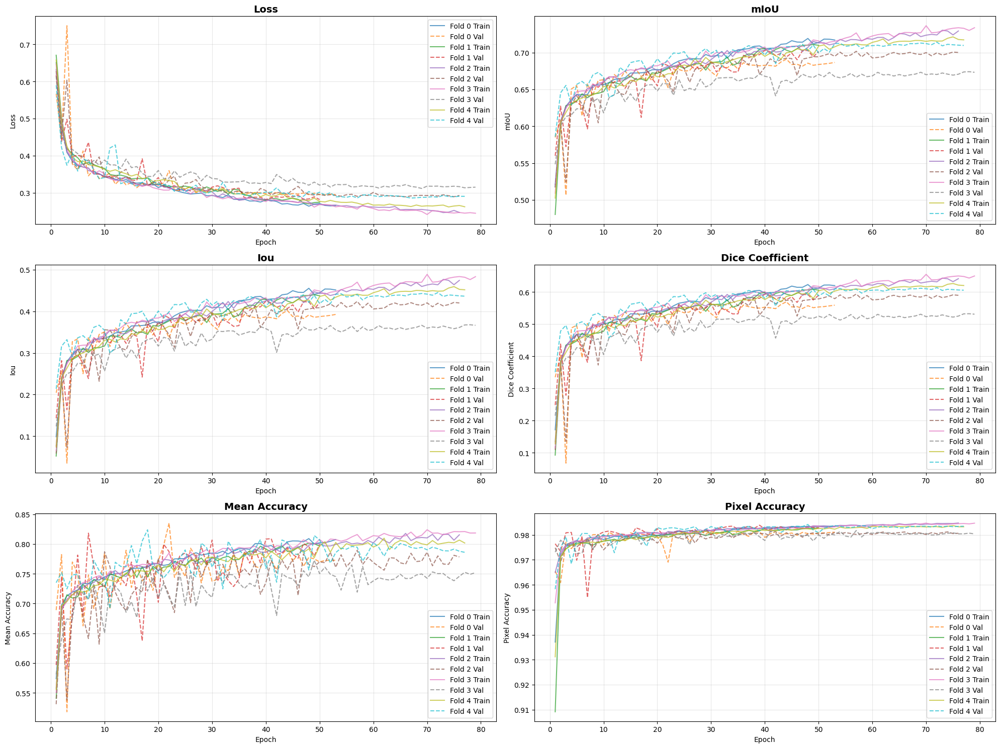

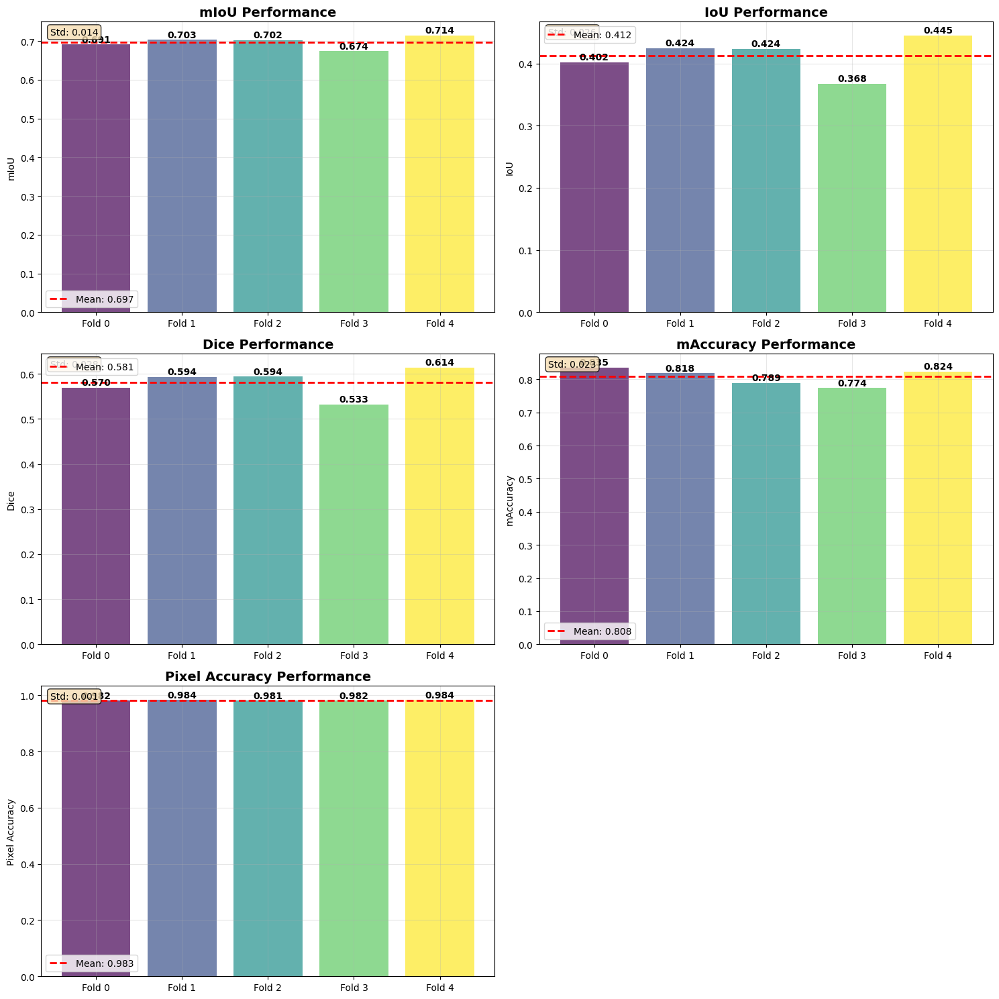

In [43]:
import math
# Plot enhanced training curves
def plot_training_curves(fold_results):
    metrics = ['loss', 'miou', 'iou',  'dice', 'maccuracy', 'pixel_accuracy']
    titles = ['Loss', 'mIoU', 'Iou','Dice Coefficient', 'Mean Accuracy', 'Pixel Accuracy']
    n_metrics = len(metrics)
    ncols = 2
    nrows = math.ceil(n_metrics / ncols)
    fig, axes = plt.subplots(nrows, ncols, figsize=(20, 5*nrows))
    axes = axes.flatten()
    for i, (metric, title) in enumerate(zip(metrics, titles)):
        ax = axes[i]
        for fold_idx, fold_result in enumerate(fold_results):
            history = fold_result['history']
            epochs = range(1, len(history[f'train_{metric}']) + 1)
            ax.plot(epochs, history[f'train_{metric}'], label=f'Fold {fold_idx} Train', linestyle='-', alpha=0.7)
            ax.plot(epochs, history[f'val_{metric}'], label=f'Fold {fold_idx} Val', linestyle='--', alpha=0.7)
        ax.set_title(title, fontsize=14, fontweight='bold')
        ax.set_xlabel('Epoch')
        ax.set_ylabel(title)
        ax.legend()
        ax.grid(True, alpha=0.3)
    for i in range(n_metrics, len(axes)):
        axes[i].axis('off')
    plt.tight_layout()
    plt.show()

def plot_metrics_comparison(fold_results):
    """Plot side-by-side comparison of all metrics"""
    n_folds = len(fold_results)
    metrics_data = {
        'mIoU': [fold['best_val_miou'] for fold in fold_results],
        'IoU': [fold['best_val_iou'] for fold in fold_results],
        'Dice': [fold['best_val_dice'] for fold in fold_results],
        'mAccuracy': [fold['best_val_maccuracy'] for fold in fold_results],
        'Pixel Accuracy': [fold['best_val_pixel_accuracy'] for fold in fold_results]
    }
    n_metrics = len(metrics_data)
    ncols = 2
    nrows = math.ceil(n_metrics / ncols)
    fig, axes = plt.subplots(nrows, ncols, figsize=(15, 5 * nrows))
    axes = axes.flatten()
    for i, (metric_name, values) in enumerate(metrics_data.items()):
        ax = axes[i]
        folds = [f'Fold {i}' for i in range(n_folds)]
        bars = ax.bar(folds, values, alpha=0.7, color=plt.cm.viridis(np.linspace(0, 1, n_folds)))
        for bar, value in zip(bars, values):
            ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.001,
                   f'{value:.3f}', ha='center', va='bottom', fontweight='bold')
        mean_val = np.mean(values)
        ax.axhline(y=mean_val, color='red', linestyle='--', linewidth=2, label=f'Mean: {mean_val:.3f}')
        std_val = np.std(values)
        ax.text(0.02, 0.98, f'Std: {std_val:.3f}', transform=ax.transAxes,
               verticalalignment='top', bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.8))
        ax.set_title(f'{metric_name} Performance', fontsize=14, fontweight='bold')
        ax.set_ylabel(metric_name)
        ax.legend()
        ax.grid(True, alpha=0.3)
    for i in range(n_metrics, len(axes)):
        axes[i].axis('off')
    plt.tight_layout()
    plt.show()

# Plot enhanced training curves
plot_training_curves(fold_results)
plot_metrics_comparison(fold_results)

In [44]:
# Enhanced cross-validation results summary
def summarize_cv_results(fold_results, timing_summary=None):
    """Comprehensive cross-validation results summary with enhanced metrics"""
    print("="*80)
    print("COMPREHENSIVE CROSS-VALIDATION RESULTS SUMMARY")
    print("="*80)

    # Create results DataFrame with enhanced metrics
    results_data = []
    for fold_result in fold_results:
        fold_data = {
            'Fold': fold_result['fold'],
            'Val Loss': fold_result['best_val_loss'],
            'Val mIoU': fold_result['best_val_miou'],
            'Val IoU': fold_result['best_val_iou'],
            'Val Dice': fold_result['best_val_dice'],
            'Val mAccuracy': fold_result['best_val_maccuracy'],
            'Val Pixel Acc': fold_result['best_val_pixel_accuracy'],
            'Epochs': fold_result['epochs_trained']
        }
        results_data.append(fold_data)

    results_df = pd.DataFrame(results_data)

    # Calculate comprehensive statistics
    summary_stats = results_df.describe()

    print("FOLD-BY-FOLD RESULTS:")
    print("-" * 80)
    print(results_df.to_string(index=False, float_format='%.4f'))

    print(f"\nSTATISTICAL SUMMARY:")
    print("-" * 80)
    print(summary_stats.to_string(float_format='%.4f'))

    # Key performance metrics
    print(f"\nKEY PERFORMANCE METRICS:")
    print("-" * 80)
    metrics = ['Val mIoU', 'Val IoU', 'Val Dice', 'Val mAccuracy', 'Val Pixel Acc']
    for metric in metrics:
        mean_val = results_df[metric].mean()
        std_val = results_df[metric].std()
        min_val = results_df[metric].min()
        max_val = results_df[metric].max()
        print(f"{metric:15}: {mean_val:.4f} ± {std_val:.4f} (range: {min_val:.4f} - {max_val:.4f})")

    # Training efficiency
    print(f"\nTRAINING EFFICIENCY:")
    print("-" * 80)
    avg_epochs = results_df['Epochs'].mean()
    print(f"Average epochs to convergence: {avg_epochs:.1f}")
    print(f"Early stopping effectiveness: {(200 - avg_epochs)/200*100:.1f}% time saved")

    # Timing information
    if timing_summary:
        print(f"\nTIMING ANALYSIS:")
        print("-" * 80)
        for operation, stats in timing_summary.items():
            if 'total' in operation or 'training' in operation:
                print(f"{operation:30}: {stats['total']:.2f}s total, {stats['average']:.2f}s avg")

    # Model stability assessment
    print(f"\nMODEL STABILITY ASSESSMENT:")
    print("-" * 80)
    miou_cv = results_df['Val mIoU'].std() / results_df['Val mIoU'].mean()
    dice_cv = results_df['Val Dice'].std() / results_df['Val Dice'].mean()
    print(f"mIoU Coefficient of Variation: {miou_cv:.3f} ({'Low' if miou_cv < 0.1 else 'Moderate' if miou_cv < 0.2 else 'High'} variability)")
    print(f"Dice Coefficient of Variation: {dice_cv:.3f} ({'Low' if dice_cv < 0.1 else 'Moderate' if dice_cv < 0.2 else 'High'} variability)")

    # Performance categorization
    print(f"\nPERFORMANCE CATEGORIZATION:")
    print("-" * 80)
    mean_miou = results_df['Val mIoU'].mean()
    mean_dice = results_df['Val Dice'].mean()

    if mean_miou >= 0.8:
        miou_cat = "Excellent"
    elif mean_miou >= 0.7:
        miou_cat = "Good"
    elif mean_miou >= 0.6:
        miou_cat = "Fair"
    else:
        miou_cat = "Needs Improvement"

    if mean_dice >= 0.8:
        dice_cat = "Excellent"
    elif mean_dice >= 0.7:
        dice_cat = "Good"
    elif mean_dice >= 0.6:
        dice_cat = "Fair"
    else:
        dice_cat = "Needs Improvement"

    print(f"mIoU Performance: {miou_cat} ({mean_miou:.3f})")
    print(f"Dice Performance: {dice_cat} ({mean_dice:.3f})")

    # Best performing fold
    best_fold_idx = results_df.loc[results_df['Val mIoU'].idxmax(), 'Fold']
    best_fold_miou = results_df.loc[results_df['Val mIoU'].idxmax(), 'Val mIoU']
    print(f"\nBest performing fold: Fold {best_fold_idx} (mIoU: {best_fold_miou:.4f})")

    return results_df

# Generate comprehensive summary
cv_results = summarize_cv_results(fold_results, global_timer.get_summary() if 'global_timer' in locals() else None)

COMPREHENSIVE CROSS-VALIDATION RESULTS SUMMARY
FOLD-BY-FOLD RESULTS:
--------------------------------------------------------------------------------
 Fold  Val Loss  Val mIoU  Val IoU  Val Dice  Val mAccuracy  Val Pixel Acc  Epochs
    0    0.2943    0.6911   0.4020    0.5696         0.8352         0.9818      53
    1    0.2814    0.7031   0.4241    0.5937         0.8181         0.9839      50
    2    0.2889    0.7018   0.4237    0.5940         0.7894         0.9812      76
    3    0.3114    0.6740   0.3676    0.5327         0.7740         0.9818      79
    4    0.2856    0.7141   0.4449    0.6140         0.8237         0.9842      77

STATISTICAL SUMMARY:
--------------------------------------------------------------------------------
        Fold  Val Loss  Val mIoU  Val IoU  Val Dice  Val mAccuracy  Val Pixel Acc  Epochs
count 5.0000    5.0000    5.0000   5.0000    5.0000         5.0000         5.0000  5.0000
mean  2.0000    0.2923    0.6968   0.4125    0.5808         0.8081   

Testing best model from Fold 4 (mIoU: 0.7141)
COMPREHENSIVE MODEL TESTING
TEST SET PERFORMANCE:
----------------------------------------
Test Loss:           0.3172
Test mIoU (JSC):     0.6844
Test IoU (JSC):     0.3876
Test Dice:           0.5532
Test mAccuracy:      0.7560
Test Pixel Accuracy: 0.9814
\nTEST TIMING:
----------------------------------------
Data preparation: 0.001s
Inference time:   59.608s
Total test time:  59.609s
Inference per sample: 669.75ms
\nGENERATING PREDICTION VISUALIZATIONS...


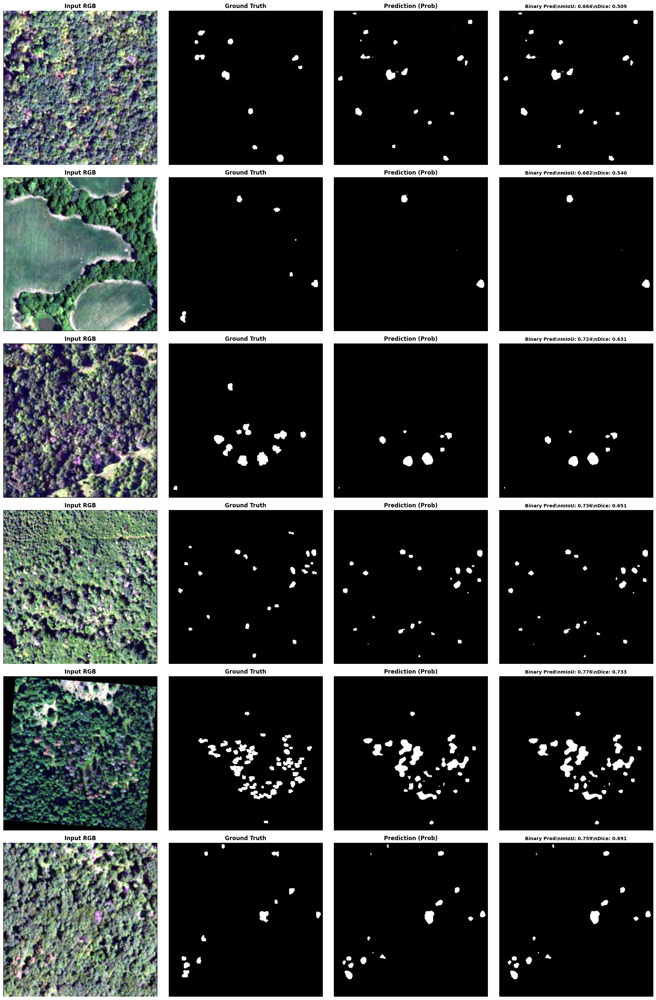

In [45]:
def test_model_performance(model, test_indices, matched_files, config, timer=None):
    """Comprehensive testing evaluation with timing"""
    print("="*60)
    print("COMPREHENSIVE MODEL TESTING")
    print("="*60)

    if timer:
        timer.start_timer('test_data_preparation')

    # Create test dataset
    input_channels = 4 if config['input_type'] == 'rgb_nir' else 3
    test_dataset = DeadTreeDataset(
        matched_files,
        test_indices,
        input_type=config['input_type'],
        transform=get_transforms('val', input_channels=input_channels)
    )

    test_loader = DataLoader(test_dataset, batch_size=config['batch_size'],
                           shuffle=False, num_workers=0)

    if timer:
        timer.end_timer('test_data_preparation')
        timer.start_timer('test_inference')

    # Testing evaluation
    model.eval()
    test_metrics = {
        'loss': 0, 'miou': 0, 'iou': 0, 'dice': 0,
        'maccuracy': 0, 'pixel_accuracy': 0
    }

    criterion = CombinedLoss()
    n_batches = len(test_loader)

    with torch.no_grad():
        for batch_idx, (images, masks) in enumerate(test_loader):
            images, masks = images.to(device), masks.to(device)

            outputs = model(images)
            loss = criterion(outputs, masks.float())

            test_metrics['loss'] += loss.item()
            test_metrics['miou'] += calculate_miou(outputs, masks)
            test_metrics['iou'] += calculate_iou(outputs, masks)
            test_metrics['dice'] += calculate_dice_coefficient(outputs, masks)
            test_metrics['maccuracy'] += calculate_mean_pixel_accuracy(outputs, masks)
            test_metrics['pixel_accuracy'] += calculate_pixel_accuracy(outputs, masks)

    # Average metrics
    for key in test_metrics:
        test_metrics[key] /= n_batches

    if timer:
        timer.end_timer('test_inference')

    print("TEST SET PERFORMANCE:")
    print("-" * 40)
    print(f"Test Loss:           {test_metrics['loss']:.4f}")
    print(f"Test mIoU (JSC):     {test_metrics['miou']:.4f}")
    print(f"Test IoU (JSC):     {test_metrics['iou']:.4f}")
    print(f"Test Dice:           {test_metrics['dice']:.4f}")
    print(f"Test mAccuracy:      {test_metrics['maccuracy']:.4f}")
    print(f"Test Pixel Accuracy: {test_metrics['pixel_accuracy']:.4f}")

    if timer:
        test_prep_time = timer.get_total_time('test_data_preparation')
        test_inf_time = timer.get_total_time('test_inference')
        print(f"\\nTEST TIMING:")
        print("-" * 40)
        print(f"Data preparation: {test_prep_time:.3f}s")
        print(f"Inference time:   {test_inf_time:.3f}s")
        print(f"Total test time:  {test_prep_time + test_inf_time:.3f}s")
        print(f"Inference per sample: {test_inf_time/len(test_dataset)*1000:.2f}ms")

    return test_metrics, test_dataset

def visualize_predictions(model, dataset, device, num_samples=6, timer=None):
    """Enhanced prediction visualization with timing"""
    if timer:
        timer.start_timer('visualization')

    model.eval()

    # Randomly select samples
    sample_indices = np.random.choice(len(dataset), num_samples, replace=False)

    fig, axes = plt.subplots(num_samples, 4, figsize=(20, 5*num_samples))

    with torch.no_grad():
        for i, idx in enumerate(sample_indices):
            image, mask = dataset[idx]

            # Prediction with timing
            image_input = image.unsqueeze(0).to(device)
            pred = model(image_input)
            pred_np = pred.cpu().numpy()[0, 0]  # Model includes sigmoid

            # Denormalize image for display (only show first 3 channels RGB)
            image_np = image.numpy().transpose(1, 2, 0)
            if image_np.shape[2] == 4:
                # 4-channel case, only take first 3 channels for display
                image_np = image_np[:, :, :3]

            # Denormalize (only for RGB three channels)
            image_np = image_np * np.array([0.229, 0.224, 0.225]) + np.array([0.485, 0.456, 0.406])
            image_np = np.clip(image_np, 0, 1)

            # Process mask for display
            mask_np = mask.numpy()
            if mask_np.ndim == 3 and mask_np.shape[0] == 1:
                mask_np = mask_np[0]  # Convert from [1, H, W] to [H, W]

            # Create binary prediction for comparison
            pred_binary = (pred_np > 0.5).astype(float)

            # Calculate sample metrics
            sample_miou = calculate_miou(pred, mask.unsqueeze(0).to(device))
            sample_dice = calculate_dice_coefficient(pred, mask.unsqueeze(0).to(device))

            # Display images
            axes[i, 0].imshow(image_np)
            axes[i, 0].set_title('Input RGB', fontsize=12, fontweight='bold')
            axes[i, 0].axis('off')

            axes[i, 1].imshow(mask_np, cmap='gray')
            axes[i, 1].set_title('Ground Truth', fontsize=12, fontweight='bold')
            axes[i, 1].axis('off')

            axes[i, 2].imshow(pred_np, cmap='gray', vmin=0, vmax=1)
            axes[i, 2].set_title('Prediction (Prob)', fontsize=12, fontweight='bold')
            axes[i, 2].axis('off')

            axes[i, 3].imshow(pred_binary, cmap='gray')
            axes[i, 3].set_title(f'Binary Pred\\nmIoU: {sample_miou:.3f}\\nDice: {sample_dice:.3f}',
                               fontsize=10, fontweight='bold')
            axes[i, 3].axis('off')

    plt.tight_layout()
    plt.show()

    if timer:
        timer.end_timer('visualization')

# Test the best model with proper error handling
try:
    if 'fold_results' in locals() and fold_results and len(fold_results) > 0:
        best_fold = max(fold_results, key=lambda x: x['best_val_miou'])
        print(f"Testing best model from Fold {best_fold['fold']} (mIoU: {best_fold['best_val_miou']:.4f})")

        # Test on the test set
        if 'folds' in locals() and folds and len(folds) > 0:
            test_metrics, test_dataset = test_model_performance(
                best_fold['model'],
                folds[0]['test_idx'],  # Use test indices from first fold (same for all)
                matched_files,
                config,
                global_timer if 'global_timer' in locals() else None
            )

            # Visualize predictions
            print(f"\\nGENERATING PREDICTION VISUALIZATIONS...")
            visualize_predictions(
                best_fold['model'],
                test_dataset,
                device,
                num_samples=6,
                timer=global_timer if 'global_timer' in locals() else None
            )
        else:
            print("Warning: Cross-validation folds are not available. Cannot perform testing.")
    else:
        print("Warning: fold_results is not available. Please run the training first.")

except Exception as e:
    print(f"Error during model testing: {e}")

In [46]:
save_dir='/content/drive/MyDrive/models_' + str(int(time.time()))
# Enhanced model saving and metadata
def save_best_model(fold_results, cv_results, test_metrics=None, timing_summary=None, save_dir=save_dir):
    """Save best model with comprehensive metadata"""
    if not os.path.exists(save_dir):
        os.makedirs(save_dir)

    # Find best model
    best_fold = max(fold_results, key=lambda x: x['best_val_miou'])

    # Prepare comprehensive metadata
    metadata = {
        'model_info': {
            'architecture': 'DeeplabV3+',
            'input_channels': 4 if config['input_type'] == 'rgb_nir' else 3,
            'input_type': config['input_type'],
            'output_channels': 1,
            'input_size': (256, 256)
        },
        'training_config': config,
        'best_fold': {
            'fold_id': best_fold['fold'],
            'epochs_trained': best_fold['epochs_trained'],
            'val_loss': best_fold['best_val_loss'],
            'val_miou': best_fold['best_val_miou'],
            'val_iou': best_fold['best_val_iou'],
            'val_dice': best_fold['best_val_dice'],
            'val_maccuracy': best_fold['best_val_maccuracy'],
            'val_pixel_accuracy': best_fold['best_val_pixel_accuracy']
        },
        'cross_validation_summary': {
            'n_folds': len(fold_results),
            'mean_miou': cv_results['Val mIoU'].mean(),
            'std_miou': cv_results['Val mIoU'].std(),
            'mean_iou': cv_results['Val IoU'].mean(),
            'std_iou': cv_results['Val IoU'].std(),
            'mean_dice': cv_results['Val Dice'].mean(),
            'std_dice': cv_results['Val Dice'].std(),
            'mean_maccuracy': cv_results['Val mAccuracy'].mean(),
            'std_maccuracy': cv_results['Val mAccuracy'].std()
        },
        'test_performance': test_metrics if test_metrics else {},
        'timing_info': timing_summary if timing_summary else {},
        'training_date': datetime.now().strftime('%Y-%m-%d %H:%M:%S'),
        'device_used': str(device)
    }

    # Save model with metadata
    model_path = os.path.join(save_dir, 'best_deeplabv3plus_4channel_model.pth')
    torch.save({
        'model_state_dict': best_fold['model'].state_dict(),
        'metadata': metadata,
        'model_architecture': str(best_fold['model'])
    }, model_path)

    # Save metadata as JSON for easy reading
    import json
    metadata_path = os.path.join(save_dir, 'model_metadata.json')
    with open(metadata_path, 'w') as f:
        # Convert numpy types to Python types for JSON serialization
        def convert_numpy(obj):
            if isinstance(obj, np.integer):
                return int(obj)
            elif isinstance(obj, np.floating):
                return float(obj)
            elif isinstance(obj, np.ndarray):
                return obj.tolist()
            return obj

        json_metadata = json.loads(json.dumps(metadata, default=convert_numpy))
        json.dump(json_metadata, f, indent=2)

    print(f"="*60)
    print("MODEL SAVING COMPLETED")
    print(f"="*60)
    print(f"Best model saved to: {model_path}")
    print(f"Metadata saved to: {metadata_path}")
    print(f"Best model metrics:")
    print(f"  Fold: {best_fold['fold']}")
    print(f"  mIoU: {best_fold['best_val_miou']:.4f}")
    print(f"  Dice: {best_fold['best_val_dice']:.4f}")
    print(f"  mAccuracy: {best_fold['best_val_maccuracy']:.4f}")
    print(f"  Epochs trained: {best_fold['epochs_trained']}")

    return model_path, metadata_path

# Save comprehensive training history
def save_training_history(fold_results, cv_results, save_dir=save_dir):
    """Save comprehensive training history"""
    if not os.path.exists(save_dir):
        os.makedirs(save_dir)

    # Save history for each fold
    for fold_result in fold_results:
        history_path = os.path.join(save_dir, f'fold_{fold_result["fold"]}_history.csv')
        history_df = pd.DataFrame(fold_result['history'])
        history_df.to_csv(history_path, index=False)

    # Save comprehensive summary results
    summary_path = os.path.join(save_dir, 'cv_comprehensive_summary.csv')
    cv_results.to_csv(summary_path, index=False)

    # Save aggregated metrics across all folds
    aggregated_metrics = {
        'metric': ['Val mIoU', 'Val IoU', 'Val Dice', 'Val mAccuracy', 'Val Pixel Acc', 'Val Loss'],
        'mean': [cv_results['Val mIoU'].mean(), cv_results['Val IoU'].mean(), cv_results['Val Dice'].mean(),
                cv_results['Val mAccuracy'].mean(), cv_results['Val Pixel Acc'].mean(),
                cv_results['Val Loss'].mean()],
        'std': [cv_results['Val mIoU'].std(), cv_results['Val IoU'].std(), cv_results['Val Dice'].std(),
               cv_results['Val mAccuracy'].std(), cv_results['Val Pixel Acc'].std(),
               cv_results['Val Loss'].std()],
        'min': [cv_results['Val mIoU'].min(), cv_results['Val IoU'].min(), cv_results['Val Dice'].min(),
               cv_results['Val mAccuracy'].min(), cv_results['Val Pixel Acc'].min(),
               cv_results['Val Loss'].min()],
        'max': [cv_results['Val mIoU'].max(), cv_results['Val mIoU'].max(), cv_results['Val Dice'].max(),
               cv_results['Val mAccuracy'].max(), cv_results['Val Pixel Acc'].max(),
               cv_results['Val Loss'].max()]
    }

    aggregated_df = pd.DataFrame(aggregated_metrics)
    aggregated_path = os.path.join(save_dir, 'aggregated_metrics.csv')
    aggregated_df.to_csv(aggregated_path, index=False)

    print(f"Training history saved to: {save_dir}")
    print(f"Files created:")
    print(f"  - Individual fold histories: fold_X_history.csv")
    print(f"  - Cross-validation summary: cv_comprehensive_summary.csv")
    print(f"  - Aggregated metrics: aggregated_metrics.csv")

# Save model and comprehensive history with proper error handling
try:
    # Check if required variables exist
    if 'fold_results' in locals() and fold_results and len(fold_results) > 0:
        if 'cv_results' in locals() and cv_results is not None and not cv_results.empty:
            model_path, metadata_path = save_best_model(
                fold_results,
                cv_results,
                test_metrics if 'test_metrics' in locals() else None,
                global_timer.get_summary() if 'global_timer' in locals() else None
            )
            save_training_history(fold_results, cv_results)
        else:
            print("Warning: cv_results is not available. Skipping model saving.")
    else:
        print("Warning: fold_results is not available. Skipping model saving.")

except Exception as e:
    print(f"Error saving model: {e}")

MODEL SAVING COMPLETED
Best model saved to: /content/drive/MyDrive/models_1753607505/best_deeplabv3plus_4channel_model.pth
Metadata saved to: /content/drive/MyDrive/models_1753607505/model_metadata.json
Best model metrics:
  Fold: 4
  mIoU: 0.7141
  Dice: 0.6140
  mAccuracy: 0.8237
  Epochs trained: 77
Training history saved to: /content/drive/MyDrive/models_1753607505
Files created:
  - Individual fold histories: fold_X_history.csv
  - Cross-validation summary: cv_comprehensive_summary.csv
  - Aggregated metrics: aggregated_metrics.csv


[Download best_deeplabv3+_4channel_model.pth (Google Drive)](https://drive.google.com/file/d/1ZQHift8D8IDVFx2LlsZJjj3-R7WWch43/view?usp=drive_link)